In [1]:
import pandas as pd
import seaborn.apionly as sns
import matplotlib.pyplot as plt
import numpy as np; np.random.seed(1)
from scipy import stats
%matplotlib inline
%config InlineBackend.figure_format = 'svg' # For clear Figure Output

C:\ProgramData\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The examples.directory rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2. In the future, examples will be found relative to the 'datapath' directory.
  self[key] = other[key]
C:\ProgramData\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The savefig.frameon rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
C:\ProgramData\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 3.0 and will be removed in 3.2.
  self[key] = other[key]
C:\ProgramData\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.fileo rcparam was deprecated in Matplotlib 3.1 and will be removed in 3.3.
  self[key] = other[key]
C:\ProgramData\Anaconda3\lib\_collections_abc.py:841: MatplotlibDeprecationWarning: 
The verbose.level rcparam was deprecate

# What Make Them High Rated?

## Yelp Analysis By Yixin Jin in MSSP 607
Data Source: https://www.yelp.com/dataset/documentation/main

# Import File

In [2]:
# convert the large JSON full restaurants and reviews files
# into two Pandas dataframes.
def fetch_restaurant(businesses):
    with open(businesses_filename,encoding='utf-8') as in_file:
        businesses = pd.read_json(in_file, lines = True)
        #print(businesses.shape)
        #print(businesses.columns)
        #print(businesses.head())    # Viewing the structure of each row        
    # Extacted information of the category of restaurant
    businesses['Restaurant'] = businesses.loc[:, 'categories'].str.contains("Restaurant" or "restaurant") 
    restaurants = businesses.loc[businesses['Restaurant'] == True]
    print('The dataset of Restaurants has been generated!')
    #print(restaurants.shape)
    # Generate the restaurants dataset
    #restaurants.to_csv('restaurants.csv')
    #restaurants.to_json('restaurants.json')
    return restaurants

In [3]:
businesses_filename = "business.json"
restaurants = fetch_restaurant(businesses_filename)

The dataset of Restaurants has been generated!


# Select Four Sample Cities

The regions were chosen based on three factors:
1. One Sample City for each of the four regions in the US: the Northeast, the Midwest, the South, and the West.
2. Yelp can offer most observations on these specific cities.
3. These specific cities are of differnt geographical features, covering the inland city, costal city, and riverfront city.


Therefore, we will focus on these four cities:
1. `Phoenix` in Arizona, the West;
2. `Cleveland` in Ohio, the Midwest;
3. `Charlotte` in North Carolina, the South;
4. `Pittsburgh` in Pennsylvania, the Northeast.

state  city       
AB     Airdrie          80
       Alberta           1
       Balzac            6
       Calgary        2911
       Chestermere      16
                      ... 
WI     Verona           39
       Waunakee         24
       Windsor           5
XGM    Oldham            1
XWY    Leeds             2
Length: 801, dtype: int64


,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,is_open,attributes,categories,hours,Restaurant
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,1,"{'GoodForKids': 'True', 'NoiseLevel': 'u'avera...","Sushi Bars, Restaurants, Japanese","{'Monday': '17:30-21:30', 'Wednesday': '17:30-...",True
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,1,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","Restaurants, Breakfast & Brunch, Mexican, Taco...","{'Monday': '7:0-0:0', 'Tuesday': '7:0-0:0', 'W...",True
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,1,"{'RestaurantsTakeOut': 'True', 'BusinessParkin...","Sandwiches, Salad, Restaurants, Burgers, Comfo...",None,True
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,0,"{'Alcohol': 'u'full_bar'', 'BusinessAcceptsCre...","Sandwiches, Italian, American (Traditional), A...","{'Monday': '11:0-22:0', 'Tuesday': '11:0-22:0'...",True
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,0,"{'OutdoorSeating': 'True', 'RestaurantsAttire'...","Coffee & Tea, Hookah Bars, Nightlife, Persian/...","{'Tuesday': '17:30-0:0', 'Wednesday': '17:30-0...",True
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,1,"{'BikeParking': 'True', 'RestaurantsGoodForGro...","Restaurants, Chinese, Fast Food",None,True
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,1,"{'RestaurantsTableService': 'True', 'GoodForKi...","Restaurants, Food, Desserts, Breakfast & Brunc...","{'Monday': '8:0-0:0', 'Tuesday': '8:0-0:0', 'W...",True
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,1,"{'Alcohol': ''full_bar'', 'GoodForKids': 'True...","Restaurants, Bars, Nightlife, American (Tradit...","{'Monday': '11:0-23:0', 'Tuesday': '11:0-23:0'...",True
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,0,"{'RestaurantsGoodForGroups': 'True', 'Restaura...","Mexican, Restaurants",None,True


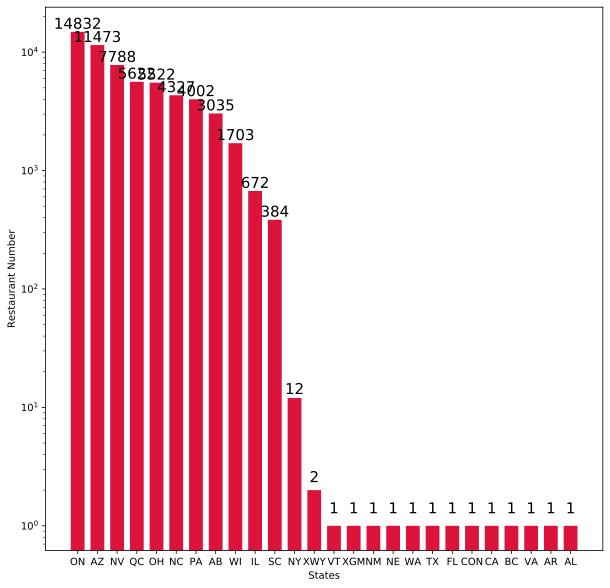

In [4]:
# Restaurant Distribution by states
df_states = restaurants.groupby('state').size()
df_states = df_states.sort_values(ascending = False)

# Use Bar Chart to present the distribution
plt.figure(figsize=(10,10))
plt.bar(df_states.index, df_states, color='crimson', width = 0.7)
plt.yscale("log")
for x, y in zip(df_states.index,df_states):
    plt.text(x, y+0.2, '%.0f' % y, ha='center', va= 'bottom',fontsize=15)
plt.grid(False)
plt.xlabel("States")
plt.ylabel("Restaurant Number")
plt.xticks(df_states.index)
plt.savefig('state.png')
# The restaurants are of imbalanced state distribution
# Indicating the need of city selection

# Restaurant Distribution by cities under the states
print(restaurants.groupby(["state", "city"]).size())
# Choose the cities with most observations within the Yelp dataset

restaurants_sample = restaurants.loc[restaurants.city.isin(['Phoenix', 'Cleveland', 'Charlotte', 'Pittsburgh'])]
restaurants_sample

# Data Preprocessing

## Slipt the Attribute Column

The column of `attributes` is a dictionary of attributes. Therefore, in order to get the attribute information of the sample restaurants, this column needs splitting. The function of `pd.Series` can be applied to split the dictionary column into separated columns.

In [5]:
attributes_split = pd.concat([restaurants_sample, restaurants_sample['attributes'].apply(pd.Series)], axis = 1).drop('attributes', axis = 1)
attributes_split
# The number of columns has increased from 15 to 53.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,Corkage,BYOBCorkage,BYOB,ByAppointmentOnly,DietaryRestrictions,AgesAllowed,Open24Hours,AcceptsInsurance,RestaurantsCounterService,HairSpecializesIn
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


## Split the Sub-dictionaries within the Attribute Column
There're six sub-dictionaries within the column of `attributes`, which need further splitting. 

### Format Conversion
Before splitting, the format of the sub-dicitonaries should be converted from `str` to `dict`.

In [6]:
# Function for format converting
# Input: a string formed dictionary
# Output: a dictionary
def str_to_dict(x):
    if x != "None":
        try:
            eval(x)
        except:
            return None
        else:
            return eval(x)
    else:
        return None

In [7]:
# Construct a list for six sub-dictionaries
attribute_subdict = ["GoodForMeal", "BusinessParking", "Ambience", "Music", "BestNights", "DietaryRestrictions"]

# Apply the format converting function to list of sub-dictionaries
for subdict in attribute_subdict:
    attributes_split[subdict] = attributes_split[subdict].apply(str_to_dict) 

### Further Split the six sub-dictionary columns.
Just as the previous attribute-splitting, the function of `pd.Series` can be applied to split the sub-dictionary columns.

In [8]:
# Split the GoodForMeal column
GoodForMeal_split = pd.concat([attributes_split, attributes_split['GoodForMeal'].apply(pd.Series)], axis = 1).drop('GoodForMeal', axis = 1)
# Rename the new columns under GoodForMeal column
GoodForMeal_split = GoodForMeal_split.rename(columns={'dessert': 'GoodForMeal_dessert'})
GoodForMeal_split = GoodForMeal_split.rename(columns={'latenight': 'GoodForMeal_latenight'})
GoodForMeal_split = GoodForMeal_split.rename(columns={'lunch': 'GoodForMeal_lunch'})
GoodForMeal_split = GoodForMeal_split.rename(columns={'dinner': 'GoodForMeal_dinner'})
GoodForMeal_split = GoodForMeal_split.rename(columns={'brunch': 'GoodForMeal_brunch'})
GoodForMeal_split = GoodForMeal_split.rename(columns={'breakfast': 'GoodForMeal_breakfast'})
GoodForMeal_split
# Six sub-attributes have been added.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,Open24Hours,AcceptsInsurance,RestaurantsCounterService,HairSpecializesIn,GoodForMeal_dessert,GoodForMeal_latenight,GoodForMeal_lunch,GoodForMeal_dinner,GoodForMeal_brunch,GoodForMeal_breakfast
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0,0.0
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,NaN,NaN,NaN,NaN,1.0,0.0,1.0,1.0,0.0,0.0
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
# Split the BusinessParking column
BusinessParking_split = pd.concat([GoodForMeal_split, GoodForMeal_split['BusinessParking'].apply(pd.Series)], axis = 1).drop('BusinessParking', axis = 1)
# Rename the new columns under BusinessParking column
BusinessParking_split = BusinessParking_split.rename(columns={'garage': 'BusinessParking_garage'})
BusinessParking_split = BusinessParking_split.rename(columns={'street': 'BusinessParking_street'})
BusinessParking_split = BusinessParking_split.rename(columns={'validated': 'BusinessParking_validated'})
BusinessParking_split = BusinessParking_split.rename(columns={'lot': 'BusinessParking_lot'})
BusinessParking_split = BusinessParking_split.rename(columns={'valet': 'BusinessParking_valet'})
BusinessParking_split
# Five sub-attributes have been added.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,GoodForMeal_latenight,GoodForMeal_lunch,GoodForMeal_dinner,GoodForMeal_brunch,GoodForMeal_breakfast,BusinessParking_garage,BusinessParking_street,BusinessParking_validated,BusinessParking_lot,BusinessParking_valet
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,0.0,0.0
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,0.0,1.0,0.0
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,NaN,NaN,NaN,NaN,NaN,0.0,0.0,1.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
# Split the Ambience column
Ambience_split = pd.concat([BusinessParking_split, BusinessParking_split['Ambience'].apply(pd.Series)], axis = 1).drop('Ambience', axis = 1)
# Rename the new columns under Ambience column
Ambience_split = Ambience_split.rename(columns={'romantic': 'Ambience_romantic'})
Ambience_split = Ambience_split.rename(columns={'intimate': 'Ambience_intimate'})
Ambience_split = Ambience_split.rename(columns={'classy': 'Ambience_classy'})
Ambience_split = Ambience_split.rename(columns={'hipster': 'Ambience_hipster'})
Ambience_split = Ambience_split.rename(columns={'divey': 'Ambience_divey'})
Ambience_split = Ambience_split.rename(columns={'touristy': 'Ambience_touristy'})
Ambience_split = Ambience_split.rename(columns={'trendy': 'Ambience_trendy'})
Ambience_split = Ambience_split.rename(columns={'upscale': 'Ambience_upscale'})
Ambience_split = Ambience_split.rename(columns={'casual': 'Ambience_casual'})
Ambience_split
# Nine sub-attributes have been added.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,BusinessParking_valet,Ambience_romantic,Ambience_intimate,Ambience_touristy,Ambience_hipster,Ambience_divey,Ambience_classy,Ambience_trendy,Ambience_upscale,Ambience_casual
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,0.0,False,False,False,False,False,False,False,False,True
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,0.0,False,False,False,False,False,False,False,False,False
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,0.0,False,False,False,False,False,False,False,False,False
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,0.0,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,1.0,False,False,False,False,False,False,False,False,True
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,0.0,False,False,False,False,False,False,True,False,True
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [11]:
# Split the Music column
Music_split = pd.concat([Ambience_split, Ambience_split['Music'].apply(pd.Series)], axis = 1).drop('Music', axis = 1)
# Rename the new columns under Music column
Music_split = Music_split.rename(columns={'dj': 'Music_dj'})
Music_split = Music_split.rename(columns={'background_music': 'Music_background_music'})
Music_split = Music_split.rename(columns={'no_music': 'Music_no_music'})
Music_split = Music_split.rename(columns={'jukebox': 'Music_jukebox'})
Music_split = Music_split.rename(columns={'live': 'Music_live'})
Music_split = Music_split.rename(columns={'video': 'Music_video'})
Music_split = Music_split.rename(columns={'karaoke': 'Music_karaoke'})
Music_split
# Seven sub-attributes have been added.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,Ambience_trendy,Ambience_upscale,Ambience_casual,Music_dj,Music_background_music,Music_jukebox,Music_live,Music_video,Music_karaoke,Music_no_music
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,False,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,False,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,False,False,False,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,False,False,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,True,False,True,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [12]:
# Split the BestNights column
BestNights_split = pd.concat([Music_split, Music_split['BestNights'].apply(pd.Series)], axis = 1).drop('BestNights', axis = 1)
# Rename the new columns under BestNights column
BestNights_split = BestNights_split.rename(columns={'monday': 'BestNights_monday'})
BestNights_split = BestNights_split.rename(columns={'tuesday': 'BestNights_tuesday'})
BestNights_split = BestNights_split.rename(columns={'wednesday': 'BestNights_wednesday'})
BestNights_split = BestNights_split.rename(columns={'thursday': 'BestNights_thursday'})
BestNights_split = BestNights_split.rename(columns={'friday': 'BestNights_friday'})
BestNights_split = BestNights_split.rename(columns={'saturday': 'BestNights_saturday'})
BestNights_split = BestNights_split.rename(columns={'sunday': 'BestNights_sunday'})
BestNights_split
# Seven sub-attributes have been added.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,Music_video,Music_karaoke,Music_no_music,BestNights_monday,BestNights_tuesday,BestNights_friday,BestNights_wednesday,BestNights_thursday,BestNights_sunday,BestNights_saturday
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,NaN,NaN,NaN,0.0,0.0,1.0,0.0,0.0,0.0,1.0
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [13]:
# Split the DietaryRestrictions column
DietaryRestrictions_split = pd.concat([BestNights_split, BestNights_split['DietaryRestrictions'].apply(pd.Series)], axis = 1).drop('DietaryRestrictions', axis = 1)
# Rename the new columns under DietaryRestrictions column
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'dairy-free': 'DietaryRestrictions_dairy-free'})
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'gluten-free': 'DietaryRestrictions_gluten-free'})
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'vegan': 'DietaryRestrictions_vegan'})
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'kosher': 'DietaryRestrictions_kosher'})
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'halal': 'DietaryRestrictions_halal'})
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'soy-free': 'DietaryRestrictions_soy-free'})
DietaryRestrictions_split = DietaryRestrictions_split.rename(columns={'vegetarian': 'DietaryRestrictions_vegetarian'})
DietaryRestrictions_split
# Seven sub-attributes have been added.

,business_id,name,address,city,state,postal_code,latitude,longitude,stars,review_count,...,BestNights_thursday,BestNights_sunday,BestNights_saturday,DietaryRestrictions_dairy-free,DietaryRestrictions_gluten-free,DietaryRestrictions_vegan,DietaryRestrictions_kosher,DietaryRestrictions_halal,DietaryRestrictions_soy-free,DietaryRestrictions_vegetarian
2,gnKjwL_1w79qoiV3IC_xQQ,Musashi Japanese Restaurant,"10110 Johnston Rd, Ste 15",Charlotte,NC,28210,35.092564,-80.859132,4.0,170,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
11,1Dfx3zM-rW4n-31KeC8sJg,Taco Bell,2450 E Indian School Rd,Phoenix,AZ,85016,33.495194,-112.028588,3.0,18,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
23,1RHY4K3BD22FK7Cfftn8Mg,Marathon Diner,"Center Core - Food Court, Fl 3, Pittsburgh Int...",Pittsburgh,PA,15231,40.496177,-80.246011,4.0,35,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
35,BvYU3jvGd0TJ7IyZdfiN2Q,Manzetti's Tavern,6401 Morrison Blvd,Charlotte,NC,28211,35.156338,-80.831878,3.5,16,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
58,_J_x_RaYTqAqAuCwgRhnRQ,Kabob House,6432 E Independence Blvd,Charlotte,NC,28212,35.172028,-80.746801,3.0,15,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
192454,NPFsOePej-_kfNsDf-SjpQ,CHIN CHIN II,"9013 Albemarle Rd, Ste 200",Charlotte,NC,28227,35.213097,-80.690425,4.5,5,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192482,dJXFp02urBN7pMd5329D_g,Factory Cafe,1000 Nc Music Factory Blvd,Charlotte,NC,28206,35.239118,-80.846060,2.5,38,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192486,UT22ExffDZjB1tzBDwSWfA,Rusty Bucket Restaurant & Tavern,4810 Ashley Park Ln,Charlotte,NC,28210,35.146186,-80.830284,3.5,109,...,0.0,0.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
192532,7KlpgRjjAmVabPzxcExs0g,Taco Mex,3525 W Glendale Ave,Phoenix,AZ,85051,33.538175,-112.135837,4.0,11,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [14]:
restaurants_split = DietaryRestrictions_split.copy()
print(restaurants_split.shape)
# The splitting work has finnished.
# Finally, there're 88 columns in this restaurant sample dataset.

(10664, 88)


## Clean the Splitted Column for Quantitative Analysis
The newly generated attribute columns are very messy. What need cleaning are listed as followed:
1. u-string;
2. the `True`, `False` and `None` are in the format of string rather than boolean or numeric form.

### Generate the General Function for cleaning
These two functions can be applied generally.

In [15]:
# Function for converting True-Faluse string to Binary variable
def str_to_binary(x):
    if x == 'None':
        return None
    elif x == 'False':
        return 0
    elif x == 'True':
        return 1

In [16]:
# Function for cleaning up u-string
def cleanup(x):
    output = "None"
    if type(x) == str:
        output = x.replace("u'","'").replace("'", "")
    if output == None:
        print(output)
    return output

### Clean the Special Column Cases
There're seven special columns, including 
1. `NoiseLevel` for four noise levels;
2. `RestaurantsPriceRange2` for four price levels;
3. `Alcohol`;
4. `WiFi` for whether there is free of paid Wi-Fi;
5. `RestaurantsAttire` for different types of dressing;
6. `Smoking` for whether the indoor smoking or outdoor smoking is allowed;
7. `BYOBCorkage` for whether Bring Your Own Bottle is allowed or charged;

In [17]:
# Function for converting the noise level string into Discrete variable
def str_to_value_NoiseLevel(x):
    if x == 'None':
        return None
    elif x == 'very_loud':
        return 4
    elif x == 'loud':
        return 3
    elif x == 'average':
        return 2
    elif x == 'quiet':
        return 1

In [18]:
print(restaurants_split.groupby("NoiseLevel").size())
restaurants_split["NoiseLevel"] = restaurants_split["NoiseLevel"].apply(cleanup)
restaurants_split["NoiseLevel_value"] = restaurants_split["NoiseLevel"].apply(str_to_value_NoiseLevel)
print("After Coverting:")
print(restaurants_split.groupby("NoiseLevel_value").size())

NoiseLevel
'average'       1020
'loud'            97
'quiet'          251
'very_loud'       23
None               8
u'average'      4166
u'loud'          474
u'quiet'        1271
u'very_loud'     189
dtype: int64
After Coverting:
NoiseLevel_value
1.0    1522
2.0    5186
3.0     571
4.0     212
dtype: int64


In [19]:
# Function for converting the string formed price column into int
def str_to_value_Price(x):
    if x != "None":
        try:
            eval(x)
        except:
            return None
        else:
            return eval(x)
    else:
        return None

In [20]:
print(restaurants_split.groupby("RestaurantsPriceRange2").size())
restaurants_split["Price_level"] = restaurants_split["RestaurantsPriceRange2"].apply(str_to_value_Price)
print("After Coverting:")
print(restaurants_split.groupby("Price_level").size())

RestaurantsPriceRange2
1       4784
2       4457
3        338
4         44
None       3
dtype: int64
After Coverting:
Price_level
1.0    4784
2.0    4457
3.0     338
4.0      44
dtype: int64


In [21]:
# Function for converting the alcohol column into Binary variable
def str_to_value_Alcohol(x):
    if x == 'None':
        return None
    elif x == 'beer_and_wine' or x =='full_bar':
        return 1
    elif x == 'none':
        return 0

In [22]:
print(restaurants_split.groupby("Alcohol").size())
restaurants_split["Alcohol"] = restaurants_split["Alcohol"].apply(cleanup)
restaurants_split["Alcohol_value"] = restaurants_split["Alcohol"].apply(str_to_value_Alcohol)
print("After Coverting:")
print(restaurants_split.groupby("Alcohol_value").size())

Alcohol
'beer_and_wine'      256
'full_bar'           612
'none'              1074
None                   4
u'beer_and_wine'     710
u'full_bar'         2534
u'none'             3188
dtype: int64
After Coverting:
Alcohol_value
0.0    4262
1.0    4112
dtype: int64


In [23]:
# Function for converting the free WIFI column into Binary variable
def str_to_value_freeWIFI(x):
    if x == 'None':
        return None
    elif x == 'no' or x =='paid':
        return 0
    elif x == 'free':
        return 1

In [24]:
print(restaurants_split.groupby("WiFi").size())
restaurants_split["WiFi"] = restaurants_split["WiFi"].apply(cleanup)
restaurants_split["freeWIFI_value"] = restaurants_split["WiFi"].apply(str_to_value_freeWIFI)
print("After Coverting:")
print(restaurants_split.groupby("freeWIFI_value").size())

WiFi
'free'     1227
'no'       1389
'paid'       18
None         14
u'free'    2404
u'no'      2387
u'paid'      39
dtype: int64
After Coverting:
freeWIFI_value
0.0    3833
1.0    3631
dtype: int64


In [25]:
# Function for converting the Attire column into Binary variable of Dressing up
def str_to_value_dressup(x):
    if x == 'None':
        return None
    elif x == 'dressy' or x =='formal':
        return 1
    elif x == 'casual':
        return 0

In [26]:
print(restaurants_split.groupby("RestaurantsAttire").size())
restaurants_split["RestaurantsAttire"] = restaurants_split["RestaurantsAttire"].apply(cleanup)
restaurants_split["RestaurantsDressup_value"] = restaurants_split["RestaurantsAttire"].apply(str_to_value_dressup)
print("After Coverting:")
print(restaurants_split.groupby("RestaurantsDressup_value").size())

RestaurantsAttire
'casual'     3507
'dressy'       89
'formal'        7
None            2
u'casual'    5153
u'dressy'     155
u'formal'       7
dtype: int64
After Coverting:
RestaurantsDressup_value
0.0    8660
1.0     258
dtype: int64


In [27]:
# Function for converting the Smoking column into Binary variable of Indoor Smoking
def str_to_value_indoorsmoking(x):
    if x == 'None':
        return None
    elif x == 'no' or x =='outdoor':
        return 0
    elif x == 'yes':
        return 1

In [28]:
print(restaurants_split.groupby("Smoking").size())
restaurants_split["Smoking"] = restaurants_split["Smoking"].apply(cleanup)
restaurants_split["IndoorSmoking_value"] = restaurants_split["Smoking"].apply(str_to_value_indoorsmoking)
print("After Coverting:")
print(restaurants_split.groupby("IndoorSmoking_value").size())

Smoking
'no'            6
'outdoor'       1
None            1
u'no'         306
u'outdoor'    233
u'yes'         13
dtype: int64
After Coverting:
IndoorSmoking_value
0.0    546
1.0     13
dtype: int64


In [29]:
# Function for converting the BYOB corkage column into Binary variable of free BYOB
def str_to_value_freeBYOB(x):
    if x == 'None':
        return None
    elif x == 'yes_corkage' or x =='no':
        return 0
    elif x == 'yes_free':
        return 1

In [30]:
print(restaurants_split.groupby("BYOBCorkage").size())
restaurants_split["BYOBCorkage"] = restaurants_split["BYOBCorkage"].apply(cleanup)
restaurants_split["freeBYOB_value"] = restaurants_split["BYOBCorkage"].apply(str_to_value_freeBYOB)
print("After Coverting:")
print(restaurants_split.groupby("freeBYOB_value").size())

BYOBCorkage
'no'              233
'yes_corkage'      34
'yes_free'        129
None                2
u'no'               1
u'yes_corkage'     10
u'yes_free'         2
dtype: int64
After Coverting:
freeBYOB_value
0.0    278
1.0    131
dtype: int64


### Clean the General Columns
Coverting the 21 general column cases from string to numeric form.

In [31]:
# Construct a list for 21 general column cases.
str_formed_list = ["GoodForKids", "RestaurantsDelivery", "Caters", "BusinessAcceptsCreditCards", 
                   "RestaurantsTakeOut", "RestaurantsTableService", "RestaurantsGoodForGroups", "OutdoorSeating", "HasTV",
                   "BikeParking", "RestaurantsReservations", "DriveThru", "BusinessAcceptsBitcoin", "CoatCheck", "HappyHour",
                   'WheelchairAccessible', 'GoodForDancing', 'DogsAllowed', 'Corkage', 'BYOB', 'ByAppointmentOnly']                    

# Apply the format converting function to list of general columns
for attribute in str_formed_list:
    print(restaurants_split.groupby(attribute).size())
    restaurants_split[f"{attribute}_value"] = restaurants_split[attribute].apply(str_to_binary)
    print("After Coverting:")
    print(restaurants_split.groupby(f"{attribute}_value").size())
    print()

GoodForKids
False    1758
None        3
True     7500
dtype: int64
After Coverting:
GoodForKids_value
0.0    1758
1.0    7500
dtype: int64

RestaurantsDelivery
False    7231
None        8
True     2002
dtype: int64
After Coverting:
RestaurantsDelivery_value
0.0    7231
1.0    2002
dtype: int64

Caters
False    2906
None       11
True     3860
dtype: int64
After Coverting:
Caters_value
0.0    2906
1.0    3860
dtype: int64

BusinessAcceptsCreditCards
False     307
None        5
True     9651
dtype: int64
After Coverting:
BusinessAcceptsCreditCards_value
0.0     307
1.0    9651
dtype: int64

RestaurantsTakeOut
False     459
None        6
True     9091
dtype: int64
After Coverting:
RestaurantsTakeOut_value
0.0     459
1.0    9091
dtype: int64

RestaurantsTableService
False    1243
True     1699
dtype: int64
After Coverting:
RestaurantsTableService_value
0.0    1243
1.0    1699
dtype: int64

RestaurantsGoodForGroups
False    1357
None        3
True     7935
dtype: int64
After Coverting:
Res

### Generate New Dataset of Cleaned Columns

In [32]:
# Generate a list of column names for the before-cleaning columns for dropping
attribute_before = str_formed_list.copy()
attribute_before_special = ["NoiseLevel", "RestaurantsPriceRange2", "Alcohol", "WiFi", "RestaurantsAttire", "Smoking", "BYOBCorkage"]
attribute_before.extend(attribute_before_special)

restaurants_clean = restaurants_split.drop(attribute_before, axis=1)
# Finally, there're 88 cleaned columns in this restaurant sample dataset.

# Q1: Exploratory Data Analysis (EDA)

After cleaning the messy columns, the **High-rated Traits Exploration** can be conducted.Beginning with **Exploratory Data Analysis**,these questions are needed answering:

1. Are the star scores level equally present in the data?    
2. Is there any missing data?
3. Are there any interesting correlations - especially with the target variable, `stars`?
4. Which factors can be theoretically hypothesized as important to be high-rated?


**Results:**
1. No.The star scores are of left-skewed distribution.
2. Yes. The `describe()` function has revealed the columns with missing values.


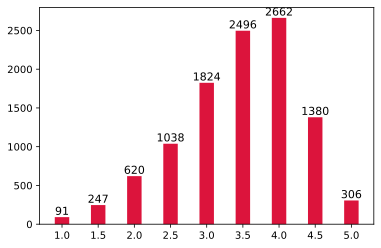

In [33]:
# Distribution of Star scores 
df_stars_size = restaurants_clean.groupby('stars').size()

# Use Bar Chart to present the distribution
plt.bar(df_stars_size.index, df_stars_size, color='crimson', width = 0.2)
for x, y in zip(df_stars_size.index,df_stars_size):
    plt.text(x, y+1, '%.0f' % y, ha='center', va= 'bottom',fontsize=11)
plt.grid(False)
plt.xticks(df_stars_size.index)
plt.savefig('star_scores.png')

In [34]:
restaurants_clean.describe().transpose()
# Among the 10664 restaurants in four cities, there're missing values.

,count,mean,std,min,25%,50%,75%,max
latitude,10664.0,36.654771,3.288327,33.26652,33.546401,35.209964,40.443291,41.611857
longitude,10664.0,-92.481678,15.192584,-112.35105,-112.031021,-81.565874,-80.740060,-79.705000
stars,10664.0,3.459537,0.819570,1.00000,3.000000,3.500000,4.000000,5.000000
review_count,10664.0,79.817236,147.471214,3.00000,10.000000,29.000000,87.000000,2556.000000
is_open,10664.0,0.701613,0.457572,0.00000,0.000000,1.000000,1.000000,1.000000
GoodForMeal_dessert,5541.0,0.064609,0.245857,0.00000,0.000000,0.000000,0.000000,1.000000
GoodForMeal_latenight,5541.0,0.066775,0.249654,0.00000,0.000000,0.000000,0.000000,1.000000
GoodForMeal_lunch,5541.0,0.617578,0.486023,0.00000,0.000000,1.000000,1.000000,1.000000
GoodForMeal_dinner,5541.0,0.512723,0.499883,0.00000,0.000000,1.000000,1.000000,1.000000
GoodForMeal_brunch,5541.0,0.113878,0.317692,0.00000,0.000000,0.000000,0.000000,1.000000


## Correlation Analysis
In ths part, we need to focus on the columns with quantitative information. In this case, the columns with information in the form of text will be dropped. 
Also, since there're many columns of missing information, the columns with extream value missing should be dropped as well.

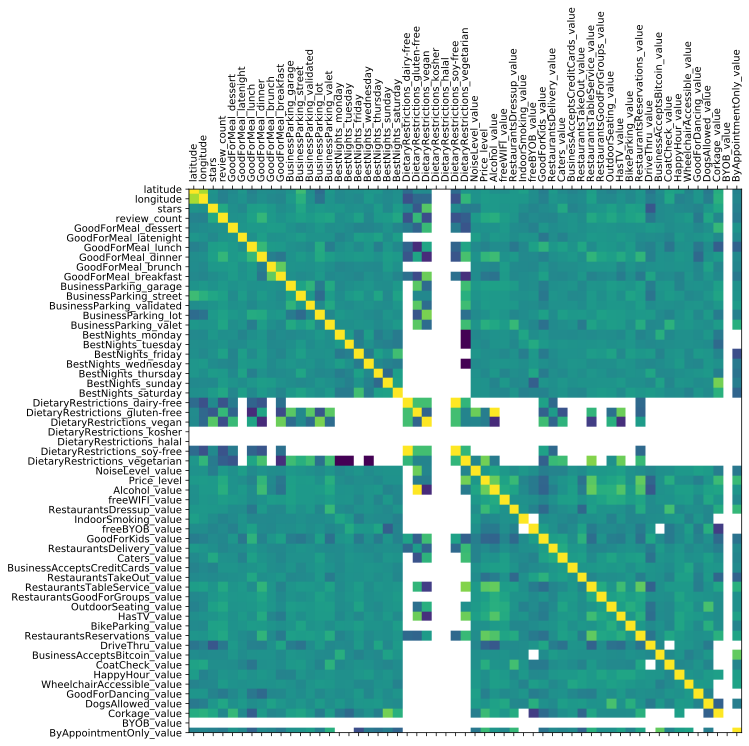

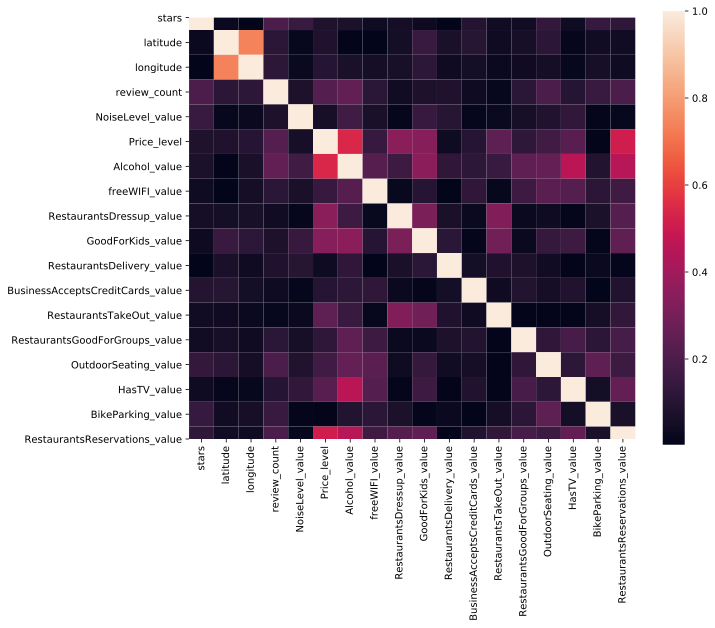

In [35]:
# Concstruct a list of columns of qualitative information
qualitative_columns = ['business_id', 'name', 'address', 'city', 'state', 'postal_code', 'is_open', 'categories', 'hours', 'Restaurant']

restaurants_corr = restaurants_clean.copy()
restaurants_corr = restaurants_corr.drop(qualitative_columns, axis=1)
# Finally, there're 78 columns of quantitative information.

# Plot correlation with all quantitative columns
df_corr = restaurants_corr.corr()
fig, ax = plt.subplots(figsize=(10, 10))
ax.matshow(df_corr)
plt.xticks(range(len(df_corr.columns)), df_corr.columns, rotation='vertical')
plt.yticks(range(len(df_corr.columns)), df_corr.columns)
# Can't gain much information because of missing values.

# Select columns with less missing values.
restaurants_selected_corr = restaurants_corr.copy()
restaurants_selected_corr = restaurants_selected_corr.loc[:,[ 'stars', 'latitude', 'longitude', 'review_count', 'NoiseLevel_value', 'Price_level', 'Alcohol_value', 'freeWIFI_value', 'RestaurantsDressup_value', 'GoodForKids_value', 'RestaurantsDelivery_value', 
                                                             'BusinessAcceptsCreditCards_value', 'RestaurantsTakeOut_value', 'RestaurantsGoodForGroups_value', 'OutdoorSeating_value', 'HasTV_value', 'BikeParking_value', 'RestaurantsReservations_value']]
# Plot correlation with selected quantitative columns
df_selected_corr = restaurants_selected_corr.corr().abs()
fig, ax = plt.subplots(figsize=(10, 8))
sns.heatmap(df_selected_corr.loc[list(df_selected_corr.index),list(df_selected_corr.index)], square=True)
plt.savefig('corrlation.png', bbox_inches='tight')

### Some Observations:
1. Taken the Correlation Matrix as a whole, the dark colors indicate the related low-correlation between these variables.
2. The `Price` is more likely to correlated with other variables like `Alchol`, `Dressup`, `GoodForKid` and `Reservation`.
3. Focus on the target `stars`, it's overall lowly correlated with other variables.

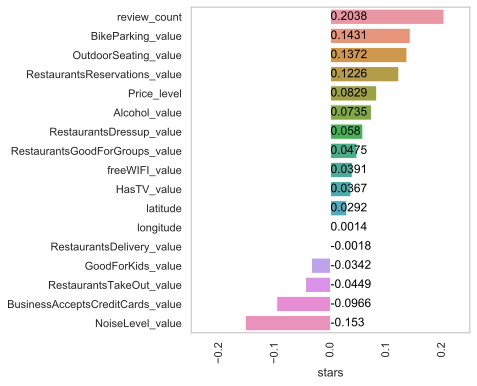

In [36]:
# Select the correlation with target varaible
df_selected_corr = restaurants_selected_corr.corr()
corr_stars = df_selected_corr.loc[df_selected_corr['stars']!=1, 'stars']
corr_stars = corr_stars.sort_values(ascending = False)

# plot correlation of stars
plt.figure(figsize=(5,6))
sns.set(style="whitegrid")
ax = sns.barplot(y=corr_stars.index, 
                 x=corr_stars.astype(np.float))
y = 0
for index, value in corr_stars.iteritems():
    ax.text(0, y, round(float(value),4), color='black',va='center')
    y+=1
ax.set_xlim(-0.25,0.25)
plt.xticks(rotation=90)
plt.grid(False)
plt.savefig('corrlation_star.png', bbox_inches='tight')

### Some Observations:
1. The *Absolute Value* of the correlation are mostly smaller than 0.2.
2. It makes sense that `NoiseLevel` is negatively correlated with `stars`. In a noisy environment, customers are less likely to have a happy conversation with their friends. In this case, they'will have a bad impression on the restaurant.
3. It makes sense that `BikeParking`, `OutdoorSeating`, `freeWIFI`, and `HasTV` are positively correlated with `stars`, indicating the high-rated restaurants are more likely to be of well-equipped facilities.
4. The negative correlations with `BusinessAcceptCreditCards`, `RestaurantsTakeOut`,and `GoodForKids`are different from the common sense, worth in-depth analysis. However, the correlation isn't equivalent to causality. Also, the significance level hasn't been reported yet. Such negative correlations can't be defined as the common features among the low-rated restaurants.
5. As for the positive correlation between `review_count` and `stars`, it demonstrates the significance of reputation, which is not the focus of this project. In this project, we will analyze from the merchants' perspectives.

# Q2: Category Analysis
For those who have the idea to open a restaurant, he/she will need to first decide open which type of restaurants.

1. How many categories within the restaurants in these four cities?
2. What are the mean star scores and the average number of reviews for the more common categories?
3. Are there any implications for the restaurant owners from the relationship between star scores and categories?


**Results:**
1. There're 473 categories for the restaurats in these four regions.
2. The restaurant types or cuisine can influence the star scores.

In [37]:
# Extract Categories information from the categories column
restaurants_q2 = restaurants_clean.copy()
possible_labels = []
for row in restaurants_q2["categories"]:
    labels = row.split(", ")
    for label in labels:
        if label not in possible_labels:
            possible_labels.append(label)

C:\ProgramData\Anaconda3\lib\site-packages\pandas\core\strings.py:1843: UserWarning: This pattern has match groups. To actually get the groups, use str.extract.
  return func(self, *args, **kwargs)


There are 473 labels.
Insignificant negatively correlated: correlation=-0.042, p=0.359


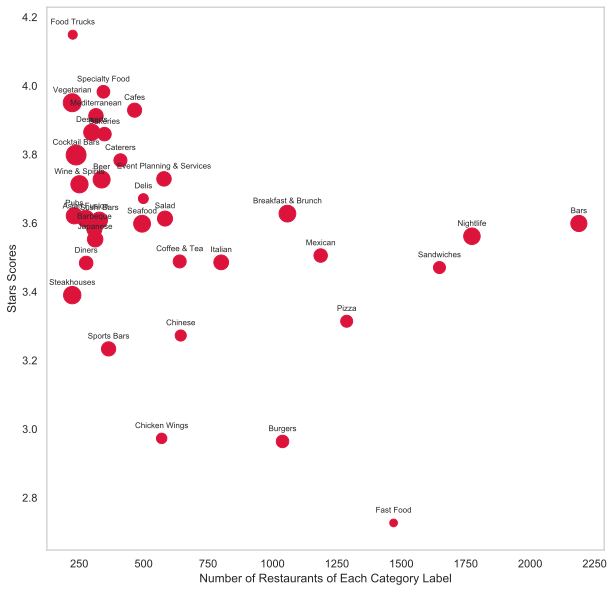

In [38]:
# Calculate the number of restaurants, the average number of reviews 
# in each restaurant, and the mean of star scores for each category
dict_label = {}
for label in possible_labels:
    label_list = []
    subset_restaurant = restaurants_q2.loc[restaurants_q2.categories.str.contains(label)]
    subset_review = subset_restaurant['review_count'].sum()
    subset_mean = subset_restaurant.stars.mean()
    if len(subset_restaurant) != 0:
        label_list.append(len(subset_restaurant))
        label_list.append(subset_review/len(subset_restaurant))
        label_list.append((subset_review/len(subset_restaurant))*2)    # 2 * the number of reviews to show the variance of review number
        label_list.append(subset_mean)
        dict_label[label] = label_list    
df_label = pd.DataFrame(dict_label).T    # Record the category information into a DataFrame
print(f"There are {len(df_label)} labels.")
df_label.columns = ['number_of_restaurant', 'review_count', 'review_count_double', 'star_score']
# Calculate the correlation and p-value between restaurants number and star scores
t_cate, p_cate = stats.pearsonr(df_label['number_of_restaurant'] ,df_label['star_score'])
print(f"Insignificant negatively correlated: correlation={t_cate:.3f}, p={p_cate:.3f}")
# The nember of the restaurants of each label is insignificantly negative correlated with star scores

# Select category labels
df_selected_label = df_label[df_label['number_of_restaurant']<4000]    # Remove the labels of Restaurant and Food
df_selected_label = df_selected_label[df_selected_label['number_of_restaurant']>220]    # Remove the labels with less than 300 restaurants

# Plot Categories by Scatter Plot
plt.figure(figsize=(10,10))
plt.scatter(df_selected_label['number_of_restaurant'], df_selected_label['star_score'],
            s = df_selected_label['review_count_double'], color='crimson')    
# The size of the dots can indicate the average number of reviews of each category
plt.xlabel("Number of Restaurants of Each Category Label")
plt.ylabel("Stars Scores")
for x, y, z in zip(df_selected_label['number_of_restaurant'],df_selected_label['star_score'], df_selected_label.index):
    plt.text(x, y+0.03, z, ha='center',fontsize=8)
plt.grid(False)
plt.savefig('categories.png')

In [39]:
# Compare two high-rated restaurant types, Food Trucks and Cafes
subset_foodtrucks = restaurants_q2.loc[restaurants_q2.categories.str.contains("Food Trucks")]
subset_cafes = restaurants_q2.loc[restaurants_q2.categories.str.contains("Cafes")]

print(f"Food Trucks: {subset_foodtrucks.stars.mean()}")
print(f"Cafes: {subset_cafes.stars.mean()}")

t_type, p_type = stats.ttest_ind(subset_foodtrucks.stars, subset_cafes.stars)
print(f"Significant difference. t={t_type:.3f}, p={p_type:.3f}")
# Demonstrating the significant star scores differences
# Therefore, the restaurant types matter.

Food Trucks: 4.148888888888889
Cafes: 3.9290322580645163
Significant difference. t=4.114, p=0.000


In [40]:
# Compare two cuisines, Mediterranean & Chinese
# Since they are of similar number of cases but of different star scores mean.
subset_mediterranean_q2 = restaurants_q2.loc[restaurants_q2.categories.str.contains("Mediterranean")]
subset_chinese_q2 = restaurants_q2.loc[restaurants_q2.categories.str.contains("Chinese")]

print(f"Mediterranean: {subset_mediterranean_q2.stars.mean()}")
print(f"Chinese: {subset_chinese_q2.stars.mean()}")

t_cuisine, p_cuisine = stats.ttest_ind(subset_mediterranean_q2.stars, subset_chinese_q2.stars)
print(f"Significant difference. t={t_cuisine:.3f}, p={p_cuisine:.3f}")
# Demonstrating the significant star scores differences
# Therefore, the cuisine types matter.

Mediterranean: 3.9126984126984126
Chinese: 3.2725155279503104
Significant difference. t=14.059, p=0.000


### Some Observations:
1. The label prevalence is not significant correlated with the star scores. Therefore, it's not necessary for the potential restaurant owners to open a common restaurants to meed the customers' daily need.
2. The decisions on restaurants types and cuisines matters to the star scores.

### Q3: Price Analysis
In this part, some pricing suggestions can be offered

1. How are star scores distribution and restaurant number distribution by different price levels?
2. Is it the previously mentioned positive correlation between price levels and star score significant?
3. For restaurants of different types and cuisines, is there a need to use different pricing strategies?

**Results:**
1. There're imbalance star scores and restaurant number distribution by four price levels.
2. The restaurant types or cuisine can influence the pricing strategy.

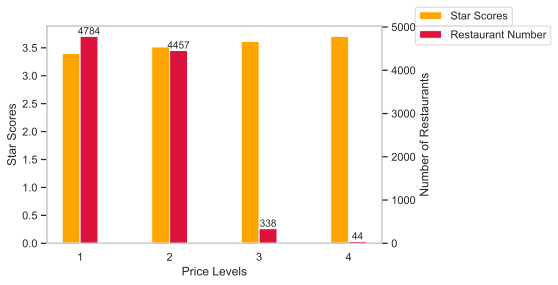

In [41]:
restaurants_q3 = restaurants_clean.copy()
# Calculate the number of restaurants and the mean of star scores for each price level
dict_price = {}
for pricelevel in range(1,5):
    price_list = []
    subset_restaurant = restaurants_q3.loc[restaurants_q3['Price_level'] == pricelevel]
    subset_mean = subset_restaurant.stars.mean()
    price_list.append(len(subset_restaurant))
    price_list.append(subset_mean)
    dict_price[pricelevel] = price_list    
df_price = pd.DataFrame(dict_price).T    # Record the price information into a DataFrame
df_price.columns = ['number_of_restaurant', 'star_score']

# Plot the distribution of star scores and restaurant number among the four price levels
# Compose the two distribution together
ax = plt.gca()
locs = np.arange(1, 5)
w = 0.2
## Draw two different axes on the same graph
ax.bar(locs-(w/2), df_price["star_score"], width = w, color="orange", label = 'Star Scores')
ax.grid(False)
ax.set_ylabel("Star Scores")
ax.set_xlabel("Price Levels")
plt.xticks(locs)
plt.legend(bbox_to_anchor=(1.1, 1), loc= 3, borderaxespad=0)
right_ax = ax.twinx()
right_ax.bar(locs+(w/2), df_price["number_of_restaurant"], width = w, color='crimson', label = 'Restaurant Number')
right_ax.set_ylabel("Number of Restaurants")
right_ax.grid(False)
for x, y in zip(locs+(w/2), df_price["number_of_restaurant"]):
    right_ax.text(x, y+1,'%.0f' % y, ha='center', va= 'bottom',fontsize=10)  
plt.legend(bbox_to_anchor=(1.1, 1), loc= 2, borderaxespad=0)
plt.savefig('price_distribution.png', bbox_inches='tight')


In [42]:
# Calculate the correlation and p-value between price levels and star scores
price_star = restaurants_q3.loc[:,['Price_level','stars']]
price_star = price_star.dropna()
t_price, p_price = stats.pearsonr(price_star['Price_level'] , price_star['stars'])
print(f"Significant positive correlated: correlation={t_price:.3f}, p={p_price:.3f}")
# Further Analysis on the specific price levels

Significant positive correlated: correlation=0.083, p=0.000


In [43]:
# Continuing the previous types comparison
subset_foodtrucks_q3 = restaurants_q3.loc[restaurants_q3.categories.str.contains("Food Trucks")]
subset_cafes_q3 = restaurants_q3.loc[restaurants_q3.categories.str.contains("Cafes")]

print(f"Food Trucks: {subset_foodtrucks_q3.Price_level.mean()}")
print(f"Cafes: {subset_cafes_q3.Price_level.mean()}")

t_typeprice, p_typeprice = stats.ttest_ind(subset_foodtrucks_q3.Price_level, subset_cafes_q3.Price_level, nan_policy = 'omit')
print(f"Significant difference. t={t_typeprice:.3f}, p={p_typeprice:.3f}")
# Demonstrating the significant price level differences among the restaurants of differnt types
# Therefore, the design of pricing strategy should depend on the restaurant types.

Food Trucks: 1.356687898089172
Cafes: 1.4626506024096386
Significant difference. t=-2.101, p=0.036


In [44]:
# Continuing the previous cuisines comparison
subset_mediterranean_q3 = restaurants_q3.loc[restaurants_q3.categories.str.contains("Mediterranean")]
subset_chinese_q3 = restaurants_q3.loc[restaurants_q3.categories.str.contains("Chinese")]

print(f"Mediterranean: {subset_mediterranean_q3.Price_level.mean()}")
print(f"Chinese: {subset_chinese_q3.Price_level.mean()}")

t_cuisinesprice, p_cuisinesprice = stats.ttest_ind(subset_mediterranean_q3.Price_level, subset_chinese_q3.Price_level, nan_policy = 'omit')
print(f"Significant difference. t={t_cuisinesprice:.3f}, p={p_cuisinesprice:.3f}")
# Demonstrating the significant price level differences among the restaurants of differnt cuisines
# Therefore, the design of pricing strategy should depend on the cuisines.

Mediterranean: 1.5714285714285714
Chinese: 1.393939393939394
Significant difference. t=4.764, p=0.000


### Some Observations:
1. The price levels are statistically significantly correlated with the star scores. However, the restaurants at the lower spending levels are more prevalent in the restaurant industry. Therefore, the restaurant owners should strike a good balance between the star scores and market sizes in the pricing strategy.
2. The decisions on price levels depend on the restaurants types and cuisines.

### Q4: Opening Hours Analysis
For the restaurant owners, adjustment to days and hours opening can be introduced into their business plan.Answering the following questions can offer implicatons for time strategy.

1. How is the star score distribution by different opening days for one week?
2. How is the star score distribution by different lasting hours for one day?
3. Are there any implications for the restaurant owners from the relationship between opening hours and categories?


**Results:**
1. There're statisitically negative correlations between opening hours and star scores.
2. The restaurant types or cuisine can influence the opening time strategy.

Significant negatively correlated with weekly opeing days: correlation=-0.246, p=0.000


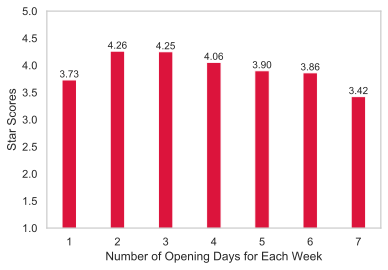

In [45]:
# Extract Hours information from the hours column
restaurants_q4 = restaurants_clean.copy()
# Split the hours column for further analysis
hours_split = pd.concat([restaurants_q4, restaurants_q4['hours'].apply(pd.Series)], axis = 1)
# Calculate the number of open days within a week
hours_split['Number_of_days'] = hours_split['hours'].apply(lambda x: len(x) if x!= None else None)    
hours_split
# There're 8 newly generated columns

# Plot the correlation between opening days and star scores
star_days = hours_split.groupby('Number_of_days')['stars'].mean()
plt.bar(star_days.index, star_days, color='crimson', width = 0.3)
plt.grid(False)
for x, y in zip(star_days.index, star_days):
    plt.text(x, y+0.01, '%.2f' % y, ha='center', va= 'bottom',fontsize=10)
plt.xlabel("Number of Opening Days for Each Week")
plt.ylabel("Star Scores")
plt.ylim(1,5)
plt.savefig('star_days.png')

# Calculate the correlation and p-value between weekly open days and star scores
days_star = hours_split.loc[:,['Number_of_days','stars']]
days_star = days_star.dropna()
t_days, p_days = stats.pearsonr(days_star['Number_of_days'] , days_star['stars'])
print(f"Significant negatively correlated with weekly opeing days: correlation={t_days:.3f}, p={p_days:.3f}")
# Different from the common sense:
# There's no necessary need to open the restaurants for every day

In [46]:
# Function for calculating the lasting hours of one day
def time_split(x):
    time = []
    if type(x) == str:
        time_record = x.split('-')    # Seperate the string into opening time and closing time
        time.extend(time_record[0].split(':'))    # Seperate the time string into hours and minutes
        time.extend(time_record[1].split(':'))
        time = list(map(int, time))
        if time[0] > time[2]:
            time[2] += 24    # For the restaurants whose closing hours are at the second day
        lasting_hours = time[2] - time[0] + (time[3]-time[1])/60    # Lasting hours calculation
        return lasting_hours
    else:
        return 0

In [47]:
# Concstruct a list of days
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

hours_split['week_lasting_hours'] = 0    # Generate a new column to record the lasting hours for a week
# Apply the lasting hours calculation function to each day within a week
for day in days:
    hours_split[f'{day}_lasting_hours'] = hours_split[f'{day}'].apply(time_split)
    hours_split['week_lasting_hours'] += hours_split[f'{day}_lasting_hours']    

# Calculate average open hours for each day
hours_split['average_lasting_hours'] = round(hours_split['week_lasting_hours']/hours_split['Number_of_days'],2)

Significant negatively correlated with average lasting hours: correlation=-0.201, p=0.000


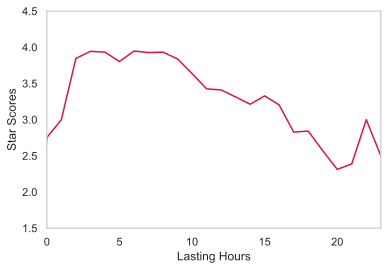

In [48]:
# Plot the correlation between average lasting hours and star scores
# Using the integer hours for better visualization performance
hours_split['average_lasting_hours_int'] = hours_split['average_lasting_hours'].apply(lambda x: int(x) if x>0  else x)   
star_hours = hours_split.groupby('average_lasting_hours_int')['stars'].mean()
star_hours.plot(color = 'crimson')
plt.grid(False)
plt.xlim(0, 23)
plt.ylim(1.5, 4.5)
plt.xlabel("Lasting Hours")
plt.ylabel("Star Scores")
plt.savefig('star_hours.png')

# Calculate the correlation and p-value between average hours and star scores
hours_star = hours_split.loc[:,['average_lasting_hours','stars']]
hours_star = hours_star.dropna()
t_hours, p_hours = stats.pearsonr(hours_star['average_lasting_hours'] , hours_star['stars'])
print(f"Significant negatively correlated with average lasting hours: correlation={t_hours:.3f}, p={p_hours:.3f}")

In [51]:
# Continuing the previous types comparison in opening days
subset_foodtrucks_q4_day = hours_split.loc[hours_split.categories.str.contains("Food Trucks")]
subset_cafes_q4_day = hours_split.loc[hours_split.categories.str.contains("Cafes")]

print(f"Food Trucks: {subset_foodtrucks_q4_day.Number_of_days.mean()}")
print(f"Cafes: {subset_cafes_q4_day.Number_of_days.mean()}")

t_typepday, p_typeday = stats.ttest_ind(subset_foodtrucks_q4_day.Number_of_days, subset_cafes_q4_day.Number_of_days, nan_policy = 'omit')
print(f"Significant difference. t={t_typepday:.3f}, p={p_typeday:.3f}")
# Demonstrating the significant price level differences among the restaurants of differnt types
# Therefore, the design of pricing strategy should depend on the restaurant types.

Food Trucks: 5.699300699300699
Cafes: 6.2592592592592595
Significant difference. t=-5.129, p=0.000


In [52]:
# Continuing the previous cuisine comparison in opening days
subset_mediterranean_q4_day = hours_split.loc[hours_split.categories.str.contains("Mediterranean")]
subset_chinese_q4_day = hours_split.loc[hours_split.categories.str.contains("Chinese")]

print(f"Mediterranean: {subset_mediterranean_q4_day.Number_of_days.mean()}")
print(f"Chinese: {subset_chinese_q4_day.Number_of_days.mean()}")

t_cuisinesday, p_cuisinesday = stats.ttest_ind(subset_mediterranean_q4_day.Number_of_days, subset_chinese_q4_day.Number_of_days, nan_policy = 'omit')
print(f"Significant difference. t={t_cuisinesday:.3f}, p={p_cuisinesday:.3f}")
# Demonstrating the significant open hours differences among the restaurants of differnt cuisines
# Therefore, the design of opening hours should depend on the cuisines.

Mediterranean: 6.473684210526316
Chinese: 6.773420479302832
Significant difference. t=-6.194, p=0.000


In [53]:
# Continuing the previous types comparison in lasting hours
subset_foodtrucks_q4_hours = hours_split.loc[hours_split.categories.str.contains("Food Trucks")]
subset_cafes_q4_hours = hours_split.loc[hours_split.categories.str.contains("Cafes")]

print(f"Food Trucks: {subset_foodtrucks_q4_hours.average_lasting_hours.mean()}")
print(f"Cafes: {subset_cafes_q4_hours.average_lasting_hours.mean()}")

t_typephours, p_typehours = stats.ttest_ind(subset_foodtrucks_q4_hours.average_lasting_hours, subset_cafes_q4_hours.average_lasting_hours, nan_policy = 'omit')
print(f"Significant difference. t={t_typephours:.3f}, p={p_typehours:.3f}")
# Demonstrating the significant price level differences among the restaurants of differnt types
# Therefore, the design of pricing strategy should depend on the restaurant types.

Food Trucks: 7.694825174825174
Cafes: 9.581975308641978
Significant difference. t=-5.426, p=0.000


In [54]:
# Continuing the previous cuisine comparison in lasting hours
subset_mediterranean_q4_hours = hours_split.loc[hours_split.categories.str.contains("Mediterranean")]
subset_chinese_q4_hours = hours_split.loc[hours_split.categories.str.contains("Chinese")]

print(f"Mediterranean: {subset_mediterranean_q4_hours.average_lasting_hours.mean()}")
print(f"Chinese: {subset_chinese_q4_hours.average_lasting_hours.mean()}")

t_cuisineshours, p_cuisineshours = stats.ttest_ind(subset_mediterranean_q4_hours.average_lasting_hours, subset_chinese_q4_hours.average_lasting_hours, nan_policy = 'omit')
print(f"Significant difference. t={t_cuisineshours:.3f}, p={p_cuisineshours:.3f}")
# Demonstrating the significant open hours differences among the restaurants of differnt cuisines
# Therefore, the design of opening hours should depend on the cuisines.

Mediterranean: 9.598385964912287
Chinese: 10.20285403050109
Significant difference. t=-3.406, p=0.001


### Some Observations:
1. The opening days and lasting hours are statistically significantly negatively correlated with the star scores, which is different from our common sense. It can be a good sign for business owners to conduct cost management.
2. The decisions on opening hours depend on the restaurant types and cuisines.

### Q5: Location Analysis
For the restaurant owners, location selection can be introduced into their business plan. Identifying the star scores distribution by different locations can offer implications for location selection strategy. Under the situation that the four sample cities are of different geographical types, comparing the distribution with the city maps can offer the audience more insights into the location selection.
In the scatterplot for each city, the size of the dot indicates the reviews number, where, the larger dot is the outcomes of more reviews. Then, the color of the dot indicates the star scores, where, the darker colors are the outcomes of higher star scores.

In [57]:
restaurants_q5 = restaurants_clean.copy()
# Calculate the correlation between star scores and location variables of latitude and longitude
t_latitude, p_latitude = stats.pearsonr(restaurants_q5.latitude, restaurants_q5.stars,)
print(f"Significant difference in latitude. t={t_latitude:.3f}, p={p_latitude:.3f}")
t_longitude, p_longitude = stats.pearsonr(restaurants_q5.longitude, restaurants_q5.stars,)
print(f"No significant difference in longitude. t={t_longitude:.3f}, p={p_longitude:.3f}")
# Overall demonstrating no significant star scores differences among restaurants in different location

Significant difference in latitude. t=0.029, p=0.003
No significant difference in longitude. t=0.001, p=0.887


In [58]:
# Plot the geography information of Phoenix
restaurants_phoenix = restaurants_q5.loc[restaurants_q5['city'] == 'Phoenix']
size_phoenix = restaurants_phoenix.review_count 
color_phonix = restaurants_phoenix.stars / 5
plt.figure(figsize=(25,20))
plt.scatter(restaurants_phoenix.longitude, restaurants_phoenix.latitude, 
            s=size_phoenix, c=255*color_phonix, cmap="Reds")
plt.grid(False)
plt.savefig('phoenix.png', transparent=True)

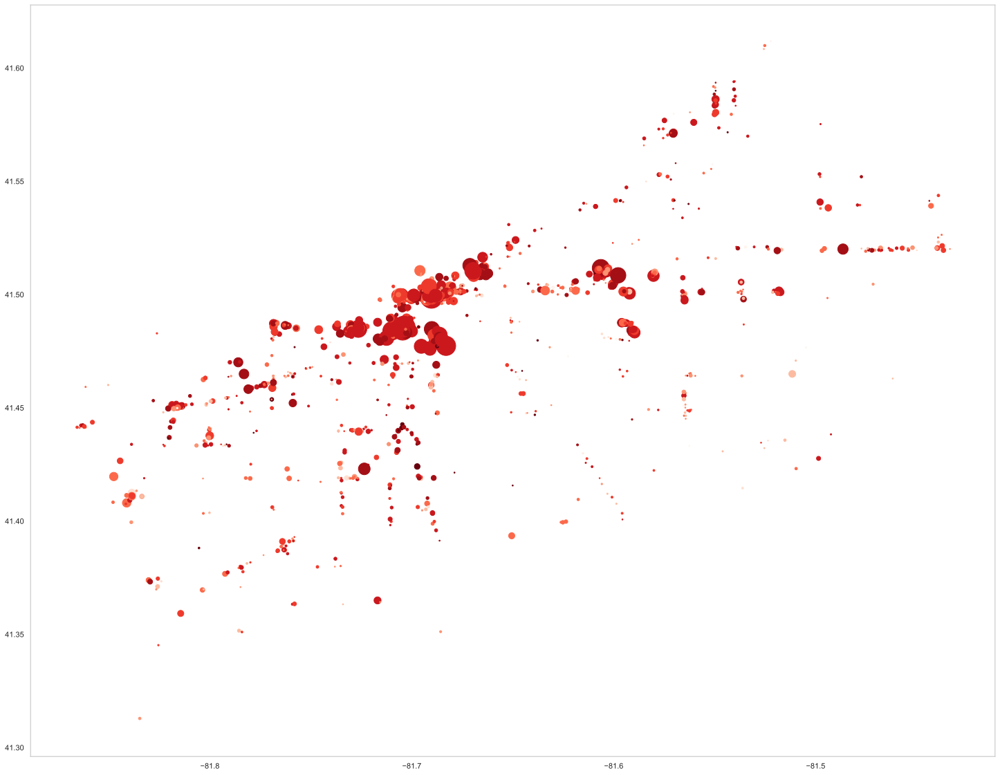

In [59]:
# Plot the geography information of Cleveland
restaurants_cleveland = restaurants_q5.loc[restaurants_q5['city'] == 'Cleveland']
size_cleveland = restaurants_cleveland.review_count
color_cleveland = restaurants_cleveland.stars / 5
plt.figure(figsize=(25,20))
plt.scatter(restaurants_cleveland.longitude, restaurants_cleveland.latitude, 
            s=size_cleveland, c=255*color_cleveland, cmap="Reds")
plt.grid(False)
plt.savefig('cleveland.png', transparent=True)


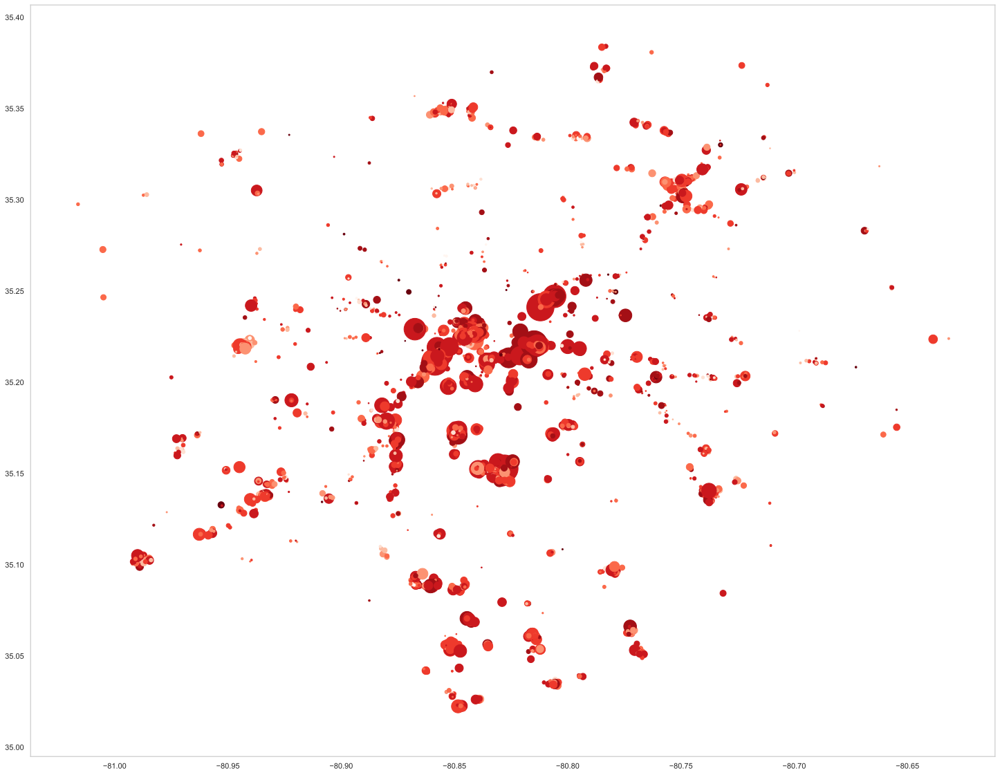

In [60]:
# Plot the geography information of Charlotte
restaurants_charlotte = restaurants_q5.loc[restaurants_q5['city'] == 'Charlotte']
size_charlotte = restaurants_charlotte.review_count
color_charlotte = restaurants_charlotte.stars / 5
plt.figure(figsize=(25,20))
plt.scatter(restaurants_charlotte.longitude, restaurants_charlotte.latitude, 
            s=size_charlotte, c=255*color_charlotte, cmap="Reds")
plt.grid(False)
plt.savefig('charlotte.png', transparent=True)


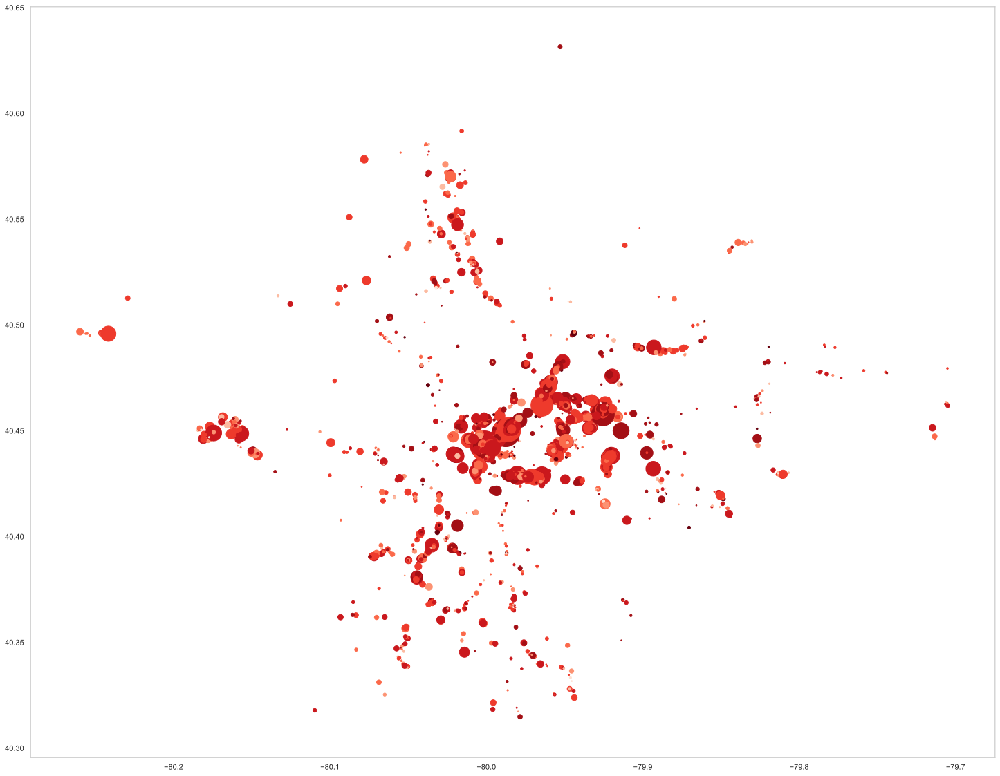

In [61]:
# Plot the geography information of Pittsburgh
restaurants_pittsburgh = restaurants_q5.loc[restaurants_q5['city'] == 'Pittsburgh']
size_pittsburgh = restaurants_pittsburgh.review_count
color_pittsburgh = restaurants_pittsburgh.stars / 5
plt.figure(figsize=(25,20))
plt.scatter(restaurants_pittsburgh.longitude, restaurants_pittsburgh.latitude, 
            s=size_pittsburgh, c=255*color_pittsburgh, cmap="Reds")
plt.grid(False)
plt.savefig('pittsburgh.png', transparent=True)


### Some Observations:
Similarities among three types of cities:
1. The higher-rated restaurants are likely to have more reviews.
2. The higher-rated restaurants tend to locate at the more regions of good transportation network, like the avenues. 

Difference:
1. Depend on the geographical features.